In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 


In [2]:
path_csv = r'/home/angelos/jupyter_notebooks/AdWords exercise (dataset) - Sheet 1.csv'
path_excel = r'/home/angelos/jupyter_notebooks/AdWords exercise (dataset).xlsx'

In [4]:
df = pd.read_excel(path_excel, skiprows=1, index_col=0, parse_dates=True)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 15834 entries, 2013-08-05 to 2013-09-24
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Campaign            5221 non-null   object 
 1   AdGroup             5221 non-null   object 
 2   Clicks              5221 non-null   float64
 3   Impressions         5221 non-null   float64
 4   CTR                 5221 non-null   float64
 5   Avg. CPC            5221 non-null   float64
 6   Cost                5221 non-null   float64
 7   Avg. position       5221 non-null   float64
 8   Conversions         5221 non-null   float64
 9   Cost/conversion     5221 non-null   float64
 10  Conversion rate     5221 non-null   float64
 11  View-through conv.  5221 non-null   float64
 12  Total conv. value   5221 non-null   float64
dtypes: float64(11), object(2)
memory usage: 1.7+ MB


In [6]:
from pandas_profiling import ProfileReport

In [8]:
profile = ProfileReport(df, title='Adwords Report', explorative=True)

In [9]:
profile.to_notebook_iframe()

#### Cheching for null values 

In [10]:
df.isnull().sum()

Campaign              10613
AdGroup               10613
Clicks                10613
Impressions           10613
CTR                   10613
Avg. CPC              10613
Cost                  10613
Avg. position         10613
Conversions           10613
Cost/conversion       10613
Conversion rate       10613
View-through conv.    10613
Total conv. value     10613
dtype: int64

#### We can see that we have null values and we want to find out where 

In [12]:
np.where(pd.isnull(df)) # returns the row and column indices where the value is NaN

(array([ 5215,  5215,  5215, ..., 15827, 15827, 15827], dtype=int32),
 array([ 0,  1,  2, ..., 10, 11, 12], dtype=int32))

#### All the Columns (1-12) contain null values and Rows from 5215 to 15827

In [14]:
df = df.dropna() # So we drop the null values 

In [16]:
df.head()

,Campaign,AdGroup,Clicks,Impressions,CTR,Avg. CPC,Cost,Avg. position,Conversions,Cost/conversion,Conversion rate,View-through conv.,Total conv. value
Day,,,,,,,,,,,,,
2013-08-05,1,100,0.0,1.0,0.0000,0.00,0.00,1.0,0.0,0.0,0.0,0.0,0.0
2013-08-08,1,100,1.0,3.0,0.3333,0.03,0.03,1.0,0.0,0.0,0.0,0.0,0.0
2013-08-10,1,100,0.0,4.0,0.0000,0.00,0.00,1.0,0.0,0.0,0.0,0.0,0.0
2013-08-14,1,100,0.0,1.0,0.0000,0.00,0.00,1.0,0.0,0.0,0.0,0.0,0.0
2013-08-18,1,100,0.0,1.0,0.0000,0.00,0.00,1.0,0.0,0.0,0.0,0.0,0.0


In [18]:
df.tail(10)

,Campaign,AdGroup,Clicks,Impressions,CTR,Avg. CPC,Cost,Avg. position,Conversions,Cost/conversion,Conversion rate,View-through conv.,Total conv. value
Day,,,,,,,,,,,,,
2013-09-26,15,536,213.0,25635.0,0.0083,0.04,8.97,1.0,2.0,4.48,0.0094,1.0,104.0
2013-09-27,15,536,899.0,111513.0,0.0081,0.04,39.51,1.0,2.0,19.76,0.0022,7.0,180.0
2013-09-20,15,537,41.0,12677.0,0.0032,0.05,1.88,1.8,0.0,0.00,0.0000,0.0,0.0
2013-09-21,15,537,70.0,20220.0,0.0035,0.05,3.31,2.2,0.0,0.00,0.0000,0.0,0.0
2013-09-24,#REF!,#REF!,0.0,1.0,0.0000,0.00,0.00,1.0,0.0,0.00,0.0000,0.0,0.0
2013-09-24,#REF!,#REF!,1.0,22.0,0.0455,0.33,0.33,1.5,0.0,0.00,0.0000,0.0,0.0
2013-09-25,#REF!,#REF!,1.0,13.0,0.0769,0.29,0.29,1.1,0.0,0.00,0.0000,0.0,0.0
2013-09-26,#REF!,#REF!,0.0,4.0,0.0000,0.00,0.00,1.0,0.0,0.00,0.0000,0.0,0.0
2013-09-24,#REF!,#REF!,0.0,1.0,0.0000,0.00,0.00,1.0,0.0,0.00,0.0000,0.0,0.0


#### Near the end of the dataset we come across to the value: '#REF!' which indicates a formula that was not properly applied in Excel <br>
We make the assumption that the missing Campaign is still the No-15 and the AdGroup assigned to the No-537

In [20]:
df['Campaign'] = df['Campaign'].replace(to_replace='#REF!', value='15')

In [22]:
df['AdGroup'] = df['AdGroup'].replace(to_replace='#REF!', value='537')

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5221 entries, 2013-08-05 to 2013-09-24
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Campaign            5221 non-null   object 
 1   AdGroup             5221 non-null   object 
 2   Clicks              5221 non-null   float64
 3   Impressions         5221 non-null   float64
 4   CTR                 5221 non-null   float64
 5   Avg. CPC            5221 non-null   float64
 6   Cost                5221 non-null   float64
 7   Avg. position       5221 non-null   float64
 8   Conversions         5221 non-null   float64
 9   Cost/conversion     5221 non-null   float64
 10  Conversion rate     5221 non-null   float64
 11  View-through conv.  5221 non-null   float64
 12  Total conv. value   5221 non-null   float64
dtypes: float64(11), object(2)
memory usage: 530.3+ KB


#### The 'Campaign' & 'AdGroup' Columns still need to be converted to numeric 

In [26]:
df['Campaign'] = pd.to_numeric(df['Campaign'])

In [28]:
df['AdGroup'] = pd.to_numeric(df['AdGroup'])

In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5221 entries, 2013-08-05 to 2013-09-24
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Campaign            5221 non-null   int64  
 1   AdGroup             5221 non-null   int64  
 2   Clicks              5221 non-null   float64
 3   Impressions         5221 non-null   float64
 4   CTR                 5221 non-null   float64
 5   Avg. CPC            5221 non-null   float64
 6   Cost                5221 non-null   float64
 7   Avg. position       5221 non-null   float64
 8   Conversions         5221 non-null   float64
 9   Cost/conversion     5221 non-null   float64
 10  Conversion rate     5221 non-null   float64
 11  View-through conv.  5221 non-null   float64
 12  Total conv. value   5221 non-null   float64
dtypes: float64(11), int64(2)
memory usage: 571.0 KB


## Outlier Detection 

In [32]:
df.describe()

,Campaign,AdGroup,Clicks,Impressions,CTR,Avg. CPC,Cost,Avg. position,Conversions,Cost/conversion,Conversion rate,View-through conv.,Total conv. value
count,5221.000000,5221.000000,5221.000000,5221.000000,5221.000000,5221.000000,5221.000000,5221.000000,5221.000000,5221.000000,5221.000000,5221.000000,5221.000000
mean,7.830109,336.686459,26.333844,2183.506608,0.246033,0.066941,1.391609,1.078472,0.729554,0.379477,0.017764,0.331929,46.091007
std,6.112081,161.434028,104.669883,8395.930028,0.340442,0.089071,4.395093,0.226374,3.813018,1.446079,0.073915,1.589463,242.543619
min,1.000000,100.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,222.000000,1.000000,3.000000,0.002000,0.020000,0.020000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,7.000000,329.000000,3.000000,24.000000,0.008900,0.050000,0.180000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,15.000000,508.000000,12.000000,827.000000,0.461500,0.080000,0.880000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,15.000000,537.000000,1602.000000,148518.000000,2.000000,1.280000,77.870000,5.000000,75.000000,23.970000,1.000000,33.000000,5687.000000


### CTR more than 100% <br> 
It happens because of various reasons but we have to treat it as 100%

In [34]:
a = np.array(df['CTR'].values.tolist())

In [36]:
df['CTR'] = np.where(a > 1, 1, a).tolist()

### Avg. position < 1 <br>
Positions start from 1  

In [38]:
b = np.array(df['Avg. position'].values.tolist())

In [40]:
df['Avg. position'] = np.where(b < 1, 1, b).tolist()

## Searching for Extreme values 

In [42]:
from scipy import stats

In [44]:
min_threshold_impr, max_threshold_impr = df.Impressions.quantile([0.001, 0.999])
min_threshold_impr, max_threshold_impr

(0.0, 129294.66000001493)

In [46]:
df[df.Impressions > max_threshold_impr]

,Campaign,AdGroup,Clicks,Impressions,CTR,Avg. CPC,Cost,Avg. position,Conversions,Cost/conversion,Conversion rate,View-through conv.,Total conv. value
Day,,,,,,,,,,,,,
2013-09-11,15,536,620.0,147699.0,0.0042,0.10,62.76,1.0,7.0,8.97,0.0113,8.0,412.0
2013-09-16,15,536,785.0,142553.0,0.0055,0.09,73.75,1.0,7.0,10.54,0.0089,13.0,416.1
2013-09-17,15,536,771.0,144834.0,0.0053,0.10,74.04,1.0,10.0,7.40,0.0130,18.0,840.0
2013-09-18,15,536,839.0,148518.0,0.0056,0.09,75.79,1.0,16.0,4.74,0.0191,20.0,969.0
2013-09-19,15,536,708.0,134310.0,0.0053,0.10,70.65,1.0,10.0,7.06,0.0141,22.0,722.0
2013-09-20,15,536,752.0,144433.0,0.0052,0.10,77.87,1.0,11.0,7.08,0.0146,33.0,492.0


In [48]:
min_threshold_clicks, max_threshold_clicks = df.Clicks.quantile([0.001, 0.999])
min_threshold_clicks, max_threshold_clicks

(0.0, 1283.4800000000105)

In [50]:
df[df.Clicks > max_threshold_clicks]

,Campaign,AdGroup,Clicks,Impressions,CTR,Avg. CPC,Cost,Avg. position,Conversions,Cost/conversion,Conversion rate,View-through conv.,Total conv. value
Day,,,,,,,,,,,,,
2013-09-20,1,493,1287.0,2266.0,0.5680,0.02,30.33,1.0,67.0,0.45,0.0521,0.0,2906.00
2013-09-22,1,493,1425.0,2477.0,0.5753,0.02,32.21,1.0,51.0,0.63,0.0358,0.0,2908.51
2013-09-23,1,493,1602.0,2947.0,0.5436,0.02,35.43,1.0,45.0,0.79,0.0281,0.0,2805.61
2013-09-24,1,493,1443.0,2752.0,0.5243,0.02,30.85,1.0,47.0,0.66,0.0326,0.0,1934.10
2013-09-25,1,493,1406.0,2670.0,0.5266,0.02,31.30,1.0,41.0,0.76,0.0292,0.0,2531.31
2013-09-26,1,493,1561.0,2606.0,0.5990,0.02,32.55,1.0,30.0,1.08,0.0192,0.0,1908.10


In [52]:
min_threshold_cost, max_threshold_cost = df.Cost.quantile([0.001, 0.999])
min_threshold_cost, max_threshold_cost

(0.0, 61.305800000004325)

In [54]:
df[df.Cost > max_threshold_cost]

,Campaign,AdGroup,Clicks,Impressions,CTR,Avg. CPC,Cost,Avg. position,Conversions,Cost/conversion,Conversion rate,View-through conv.,Total conv. value
Day,,,,,,,,,,,,,
2013-09-11,15,536,620.0,147699.0,0.0042,0.10,62.76,1.0,7.0,8.97,0.0113,8.0,412.0
2013-09-16,15,536,785.0,142553.0,0.0055,0.09,73.75,1.0,7.0,10.54,0.0089,13.0,416.1
2013-09-17,15,536,771.0,144834.0,0.0053,0.10,74.04,1.0,10.0,7.40,0.0130,18.0,840.0
2013-09-18,15,536,839.0,148518.0,0.0056,0.09,75.79,1.0,16.0,4.74,0.0191,20.0,969.0
2013-09-19,15,536,708.0,134310.0,0.0053,0.10,70.65,1.0,10.0,7.06,0.0141,22.0,722.0
2013-09-20,15,536,752.0,144433.0,0.0052,0.10,77.87,1.0,11.0,7.08,0.0146,33.0,492.0


## Correlations Between the data 

In [56]:
df.corr()

,Campaign,AdGroup,Clicks,Impressions,CTR,Avg. CPC,Cost,Avg. position,Conversions,Cost/conversion,Conversion rate,View-through conv.,Total conv. value
Campaign,1.000000,0.959788,-0.009356,0.297765,-0.637555,0.077653,0.124339,0.173309,-0.072236,0.196490,0.079956,0.245020,-0.076021
AdGroup,0.959788,1.000000,0.157005,0.292441,-0.617829,0.094941,0.206000,0.181899,0.107717,0.184327,0.070503,0.232159,0.104229
Clicks,-0.009356,0.157005,1.000000,0.434627,0.045309,-0.042391,0.778441,-0.050361,0.899448,0.295689,0.033851,0.345442,0.874465
Impressions,0.297765,0.292441,0.434627,1.000000,-0.183363,0.006797,0.768241,-0.003805,0.156500,0.517723,0.006429,0.791153,0.140344
CTR,-0.637555,-0.617829,0.045309,-0.183363,1.000000,0.101880,-0.056184,-0.162307,0.084277,-0.120086,-0.022127,-0.150775,0.087384
Avg. CPC,0.077653,0.094941,-0.042391,0.006797,0.101880,1.000000,0.106098,0.087343,-0.053867,0.108453,0.016532,0.008066,-0.053909
Cost,0.124339,0.206000,0.778441,0.768241,-0.056184,0.106098,1.000000,0.019170,0.566729,0.582107,0.020440,0.614934,0.542639
Avg. position,0.173309,0.181899,-0.050361,-0.003805,-0.162307,0.087343,0.019170,1.000000,-0.051482,0.015943,0.000176,-0.076542,-0.050413
Conversions,-0.072236,0.107717,0.899448,0.156500,0.084277,-0.053867,0.566729,-0.051482,1.000000,0.128114,0.106536,0.129049,0.981309
Cost/conversion,0.196490,0.184327,0.295689,0.517723,-0.120086,0.108453,0.582107,0.015943,0.128114,1.000000,0.055332,0.461850,0.119933


In [58]:
import seaborn as sns

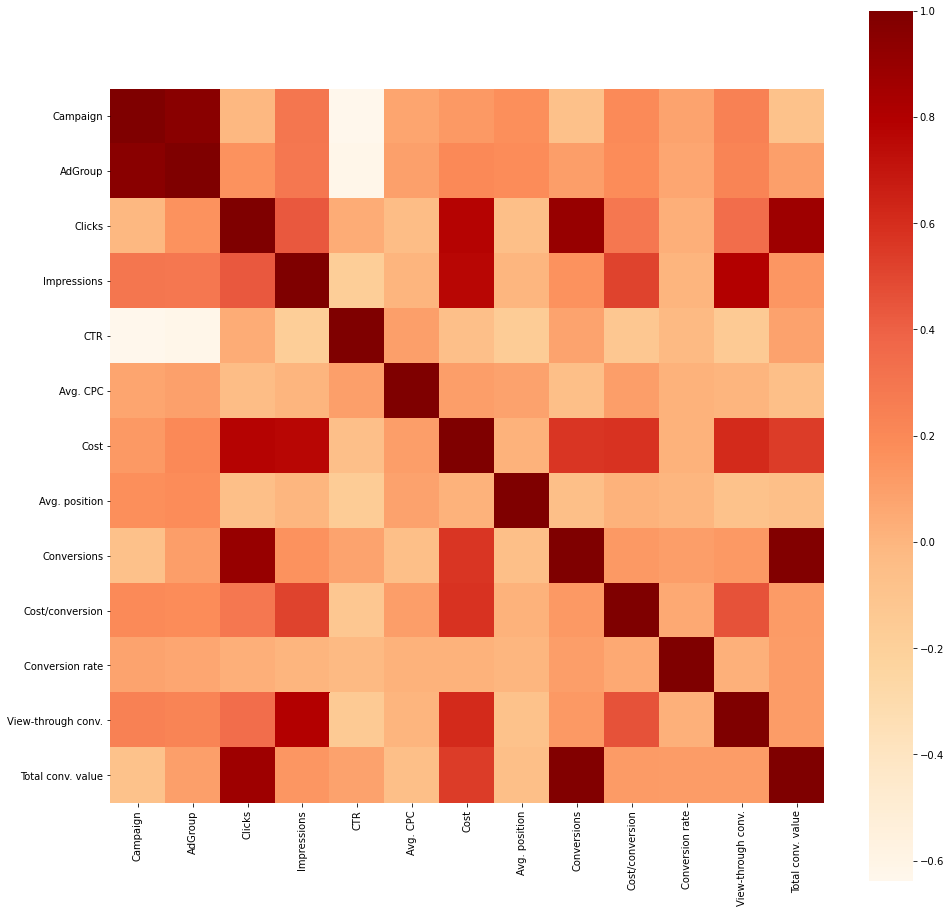

In [60]:
f, ax = plt.subplots(figsize=(16, 16))
corr = df.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap="OrRd",
            square=True, ax=ax)

In [62]:
df[['Campaign', 'Clicks']].groupby(by='Campaign').sum().plot(kind='bar')

In [64]:
import plotly.express as px

## Return on Investment (ROI) <br> 
#### We create a new metric

In [69]:
df['ROI'] = ((df.CTR.values - df.Cost.values)/df.Cost.values)*100

In [71]:
df[['Campaign', 'ROI']].groupby(by='Campaign').sum().plot(kind='bar')

In [121]:
df['ROI_2'] = (df['Conversions'].values - df['Cost/conversion'].values) / df['Cost/conversion'].values

In [122]:
campaign_ROI_2 =  df.groupby(["Campaign"])['ROI_2'].aggregate(np.sum).reset_index().sort_values('ROI_2', ascending=False)

In [123]:
campaign_ROI_2

,Campaign,ROI_2
0,1,5043.207663
3,15,561.880057
1,3,222.796029
2,7,-2.389777


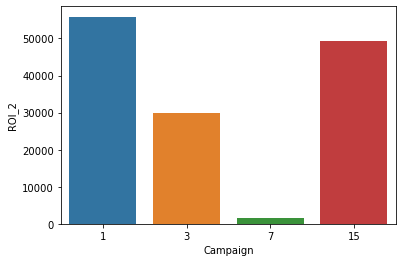

In [79]:
sns.barplot(x='Campaign', y='ROI_2', data=campaign_ROI_2)

In [81]:
df.plot.scatter(x='Avg. position', y='CTR')

In [83]:
import datetime as dt

In [85]:
aug_start = df.index.searchsorted(dt.datetime(2013, 8, 1))
aug_end = df.index.searchsorted(dt.datetime(2013, 8, 31))
sept_start = df.index.searchsorted(dt.datetime(2013, 9, 1))
sept_end = df.index.searchsorted(dt.datetime(2013, 9, 30))

In [87]:
def diff_perc(x_sept, y_aug):
    a = ((np.mean(abs(x_sept)) - np.mean(abs(y_aug)))/ np.mean(abs(y_aug)))*100
    change = 100-abs(a)
    return change

In [89]:
diff_perc(df['CTR'].iloc[sept_start:sept_end], df['CTR'].iloc[aug_start:aug_end])

1.0754900190268586

In [90]:
abs(df['CTR'].iloc[sept_start:sept_end])

Day
2013-09-01    0.0000
2013-09-02    0.0000
2013-09-03    0.0000
2013-09-04    0.0029
2013-09-05    0.0000
               ...  
2013-09-24    0.0455
2013-09-25    0.0769
2013-09-26    0.0000
2013-09-24    0.0000
2013-09-24    0.0000
Name: CTR, Length: 835, dtype: float64